In [ ]:
from google.colab import drive

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import re

In [ ]:
import pandas as pd

dataset=pd.read_csv('/content/drive/MyDrive/DerivedKnowledgeGraph_final.csv')

In [ ]:
dataset.head()

,Diseases,Symptoms
0,abscess,"pain (0.318), fever (0.119), swelling (0.112),..."
1,acid reflux,"pain (0.225), nausea (0.140), pain in upper ab..."
2,acute renal failure,"kidney failure (0.127), weakness (0.087), diar..."
3,alcohol intoxication,"slurred speech (0.071), vomiting (0.064), unst..."
4,alcoholism,"seizures (0.125), depression (0.090), sadness ..."


In [ ]:
def remove_numbers(text):
    return ''.join(filter(lambda x: not x.isdigit(), text))

# Apply the remove_numbers function to the 'Text' column
dataset['Symptoms'] = dataset['Symptoms'].apply(remove_numbers)

In [ ]:

def remove_pattern(text):
    return re.sub(r'\(\.\)', '', text)

# Apply the remove_pattern function to the 'Text' column
dataset['Symptoms'] = dataset['Symptoms'].apply(remove_pattern)

In [ ]:
dataset.head()

,Diseases,Symptoms
0,abscess,"pain , fever , swelling , redness , chills , i..."
1,acid reflux,"pain , nausea , pain in upper abdomen , abdomi..."
2,acute renal failure,"kidney failure , weakness , diarrhea , letharg..."
3,alcohol intoxication,"slurred speech , vomiting , unsteady gait , de..."
4,alcoholism,"seizures , depression , sadness , slurred spee..."


In [ ]:
dataset['Symptoms'][0]

'pain , fever , swelling , redness , chills , infection , cyst , tenderness , rectal pain , lesion , lump , sore throat , facial swelling , pimple , discomfort , difficulty swallowing , cavity , night sweats , severe pain , abdominal pain , painful swallowing , back pain '

In [ ]:
df = dataset.assign(Symptoms=dataset['Symptoms'].str.split(', ')).explode('Symptoms', ignore_index=True)

In [ ]:
string_value = "is symptome of"
df = df.assign(NewColumn=string_value)

In [ ]:
df.head()

,Diseases,Symptoms,NewColumn
0,abscess,pain,is symptome of
1,abscess,fever,is symptome of
2,abscess,swelling,is symptome of
3,abscess,redness,is symptome of
4,abscess,chills,is symptome of


In [ ]:
dataset.shape

(156, 2)

In [ ]:
dataset.head()

,Diseases,Symptoms
0,abscess,"pain , fever , swelling , redness , chills , i..."
1,acid reflux,"pain , nausea , pain in upper abdomen , abdomi..."
2,acute renal failure,"kidney failure , weakness , diarrhea , letharg..."
3,alcohol intoxication,"slurred speech , vomiting , unsteady gait , de..."
4,alcoholism,"seizures , depression , sadness , slurred spee..."


In [ ]:
df.to_csv('graphdata.csv')

#Working of other dataset

In [ ]:
disease_dataset=pd.read_csv('/content/drive/MyDrive/dataset_disease.csv')

In [ ]:
disease_dataset.head()

,Disease,Symptom_1,Symptom_2,Symptom_3,Symptom_4,Symptom_5,Symptom_6,Symptom_7,Symptom_8,Symptom_9,Symptom_10,Symptom_11,Symptom_12,Symptom_13,Symptom_14,Symptom_15,Symptom_16,Symptom_17
0,Fungal infection,itching,skin_rash,nodal_skin_eruptions,dischromic _patches,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Fungal infection,skin_rash,nodal_skin_eruptions,dischromic _patches,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Fungal infection,itching,nodal_skin_eruptions,dischromic _patches,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Fungal infection,itching,skin_rash,dischromic _patches,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Fungal infection,itching,skin_rash,nodal_skin_eruptions,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
disease_dataset.shape

(4920, 18)

In [ ]:
df_melted = disease_dataset.melt(id_vars=['Disease'], value_vars=[f'Symptom_{i}' for i in range(1, 18)], value_name='Symptom')

# Drop rows where 'Symptom' is NaN
df_melted = df_melted.dropna(subset=['Symptom'])

# Reset the index
df_melted = df_melted.reset_index(drop=True)

# Print the new DataFrame
print(df_melted[['Disease', 'Symptom']])

                Disease       Symptom
0      Fungal infection       itching
1      Fungal infection     skin_rash
2      Fungal infection       itching
3      Fungal infection       itching
4      Fungal infection       itching
...                 ...           ...
36643       Common Cold   muscle_pain
36644       Common Cold   muscle_pain
36645       Common Cold   muscle_pain
36646       Common Cold   muscle_pain
36647       Common Cold   muscle_pain

[36648 rows x 2 columns]


In [ ]:
df_melted.shape

(36648, 3)

In [ ]:
df_melted.head()

,Disease,variable,Symptom
0,Fungal infection,Symptom_1,itching
1,Fungal infection,Symptom_1,skin_rash
2,Fungal infection,Symptom_1,itching
3,Fungal infection,Symptom_1,itching
4,Fungal infection,Symptom_1,itching


In [ ]:
df_melted.drop('variable',axis=1)

,Disease,Symptom
0,Fungal infection,itching
1,Fungal infection,skin_rash
2,Fungal infection,itching
3,Fungal infection,itching
4,Fungal infection,itching
...,...,...
36643,Common Cold,muscle_pain
36644,Common Cold,muscle_pain
36645,Common Cold,muscle_pain
36646,Common Cold,muscle_pain


In [ ]:
df_melted=df_melted.drop_duplicates()

In [ ]:
df_melted=df_melted.drop('variable',axis=1)

In [ ]:
df_melted.head()

,Disease,Symptom
0,Fungal infection,itching
1,Fungal infection,skin_rash
10,Allergy,continuous_sneezing
11,Allergy,shivering
20,GERD,stomach_pain


In [ ]:
df_melted.reset_index(inplace = True)

In [ ]:
df_melted=df_melted.drop('index',axis=1)

In [ ]:
df_melted.head()

,Disease,Symptom
0,Fungal infection,itching
1,Fungal infection,skin_rash
2,Allergy,continuous_sneezing
3,Allergy,shivering
4,GERD,stomach_pain


In [ ]:
df_melted.to_csv('graphdata2.csv')

#BUILDING Knowledge Graph

In [ ]:
import pandas as pd

In [ ]:
graph_data=pd.read_csv('/content/graphdata.csv')

In [ ]:
colname=['Diseases','Symptoms']

In [ ]:
graph_data2=pd.read_csv('/content/graphdata2.csv')

In [ ]:
graph_data2.rename(columns={'Disease':'Diseases','Symptom':'Symptoms'},inplace=True)

In [ ]:
graph_data=graph_data.drop('NewColumn',axis=1)

In [ ]:
graph_data2=graph_data2.drop('Unnamed: 0',axis=1)

In [ ]:
graph_data

,Unnamed: 0,Diseases,Symptoms
0,0,abscess,pain
1,1,abscess,fever
2,2,abscess,swelling
3,3,abscess,redness
4,4,abscess,chills
...,...,...,...
3704,3704,vitamin d deficiency,dehydration
3705,3705,vitamin d deficiency,infection
3706,3706,vitamin d deficiency,insomnia
3707,3707,vitamin d deficiency,fast heart rate


In [ ]:
graph_data.Diseases.unique()

array(['abscess', 'acid reflux', 'acute renal failure',
       'alcohol intoxication', 'alcoholism', "alzheimer's disease",
       'anaphylaxis', 'anemia', 'aneurysm', 'angina', 'aphasia',
       'appendicitis', 'arrhythmia', 'arthritis', 'asthma',
       'atopic dermatitis', 'atrial fibrillation', 'bed bug bite',
       "bell's palsy", 'bipolar disorder', 'bladder cancer',
       'bone fracture', 'bone infection',
       'borderline personality disorder', 'brain tumor', 'breast cancer',
       'bronchitis', 'burn', 'cardiac arrest', 'cardiomyopathy',
       'carpal tunnel syndrome', 'cataracts', 'celiac disease',
       'cellulitis', 'cervical cancer', 'cervical radiculopathy',
       'chicken pox', 'chlamydia', 'cholangiocarcinoma', 'cholecystitis',
       'chronic kidney disease', 'chronic obstructive pulmonary disease',
       'chronic pain', 'cirrhosis of the liver', 'colon cancer',
       'common cold', 'concussion', 'congestive heart failure',
       'coronary artery disease', "

In [ ]:
graph_data2

,Diseases,Symptoms
0,Fungal infection,itching
1,Fungal infection,skin_rash
2,Allergy,continuous_sneezing
3,Allergy,shivering
4,GERD,stomach_pain
...,...,...
595,Common Cold,loss_of_smell
596,Tuberculosis,blood_in_sputum
597,Common Cold,loss_of_smell
598,Common Cold,muscle_pain


In [ ]:
frames = [graph_data, graph_data2]

resul_dataframe = pd.concat(frames)

In [ ]:
resul_dataframe.shape

(4309, 3)

In [ ]:
resul_dataframe.head()

,Unnamed: 0,Diseases,Symptoms
0,0.0,abscess,pain
1,1.0,abscess,fever
2,2.0,abscess,swelling
3,3.0,abscess,redness
4,4.0,abscess,chills


In [ ]:
resul_dataframe=resul_dataframe.drop('Unnamed: 0',axis=1)

In [ ]:
!pip install torch-geometric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 661.6/661.6 kB 9.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for torch-geometric: filename=torch_geometric-2.3.1-py3-none-any.whl size=910454 sha256=aebc24d42d7a2ac71837c12349da08c65ac777f130f4d7158add7990598bc33f
  Stored in directory: /root/.cache/pip/wheels/ac/dc/30/e2874821ff308ee67dcd7a66dbde912411e19e35a1addda028
Successfully built torch-geometric


In [ ]:
import pandas as pd
import networkx as nx
import torch
import torch.nn as nn
import torch.optim as optim
from torch_geometric.nn import GCNConv
from torch_geometric.data import Data

In [ ]:

from sklearn.preprocessing import LabelEncoder

In [ ]:
G = nx.Graph()

In [ ]:
for _, row in resul_dataframe.iterrows():
    disease = row["Diseases"]
    symptom = row["Symptoms"]
    G.add_node(disease, node_type="disease")
    G.add_node(symptom, node_type="symptom")
    G.add_edge(disease, symptom, relationship="has_symptom")

In [ ]:
import numpy as np

In [ ]:
edges = list(G.edges)

In [ ]:
print(edges)

[('abscess', 'pain '), ('abscess', 'fever '), ('abscess', 'swelling '), ('abscess', 'redness '), ('abscess', 'chills '), ('abscess', 'infection '), ('abscess', 'cyst '), ('abscess', 'tenderness '), ('abscess', 'rectal pain '), ('abscess', 'lesion '), ('abscess', 'lump '), ('abscess', 'sore throat '), ('abscess', 'facial swelling '), ('abscess', 'pimple '), ('abscess', 'discomfort '), ('abscess', 'difficulty swallowing '), ('abscess', 'cavity '), ('abscess', 'night sweats '), ('abscess', 'severe pain '), ('abscess', 'abdominal pain '), ('abscess', 'painful swallowing '), ('abscess', 'back pain '), ('pain ', 'acid reflux'), ('pain ', 'aneurysm'), ('pain ', 'angina'), ('pain ', 'appendicitis'), ('pain ', 'arthritis'), ('pain ', 'bladder cancer'), ('pain ', 'bone fracture'), ('pain ', 'bone infection'), ('pain ', 'burn'), ('pain ', 'carpal tunnel syndrome'), ('pain ', 'celiac disease'), ('pain ', 'cellulitis'), ('pain ', 'cervical cancer'), ('pain ', 'cervical radiculopathy'), ('pain ', 'c

In [ ]:
import matplotlib.pyplot as plt

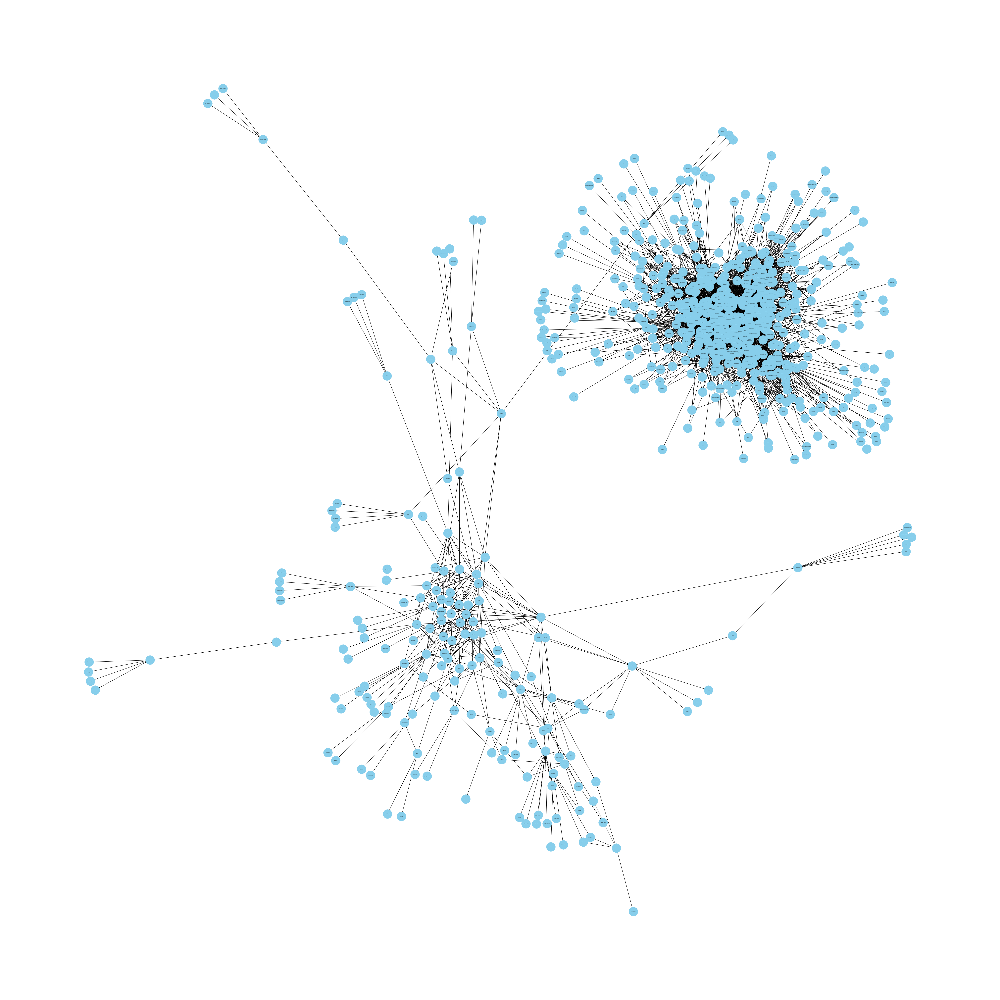

In [ ]:
plt.figure(figsize=(50, 50))  # Adjust the size as needed
nx.draw(G, with_labels=True, node_size=1050, font_size=2, node_color="skyblue", font_color="black")
plt.show()

In [ ]:
import networkx as nx
import plotly.graph_objects as go

# Create the graph
# G = nx.random_geometric_graph(200, 0.125)

# Extract node positions
pos = nx.spring_layout(G)

# Create a Plotly figure
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

node_x = []
node_y = []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(showscale=True, colorscale='Viridis', size=10),
    text=list(G.nodes()))

fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=0, l=0, r=0, t=0))
                )

fig.show()


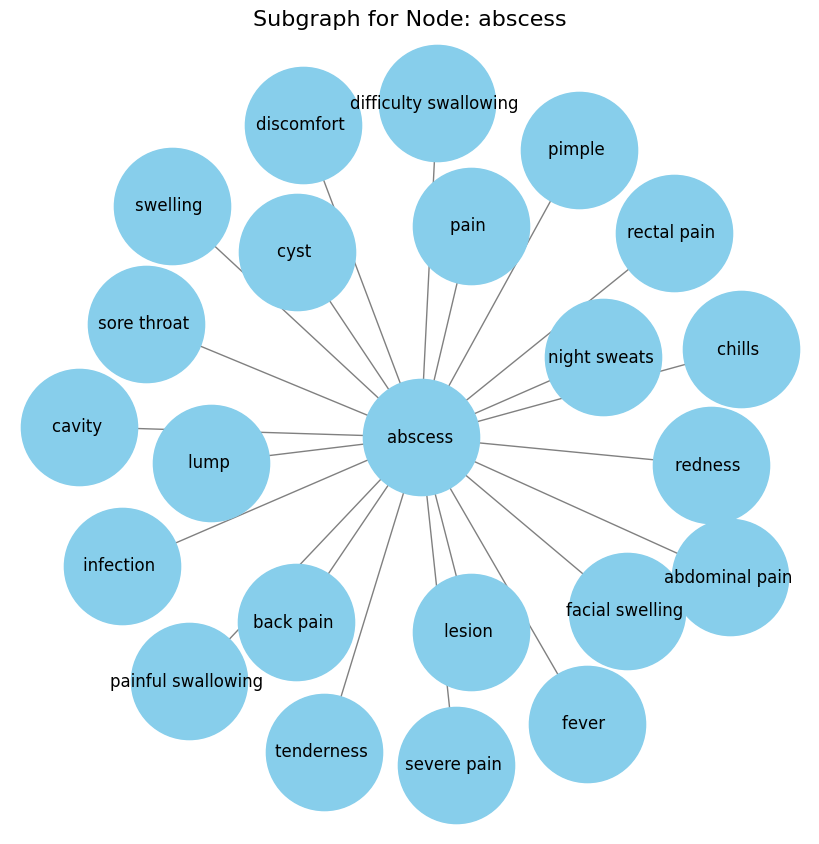

In [ ]:
target_node = "abscess"

# Extract neighbors of the target node
neighbors = list(G.neighbors(target_node))

# Create a subgraph with the target node, its neighbors, and edges
subgraph = G.subgraph([target_node] + neighbors)

# Visualize the subgraph
plt.figure(figsize=(8, 8))
pos = nx.spring_layout(subgraph, seed=42)  # You can choose a different layout algorithm
nx.draw(subgraph, pos, with_labels=True, node_size=7000, font_size=12, node_color="skyblue", font_color="black", edge_color="gray")
plt.title(f"Subgraph for Node: {target_node}", fontsize=16)
plt.show()

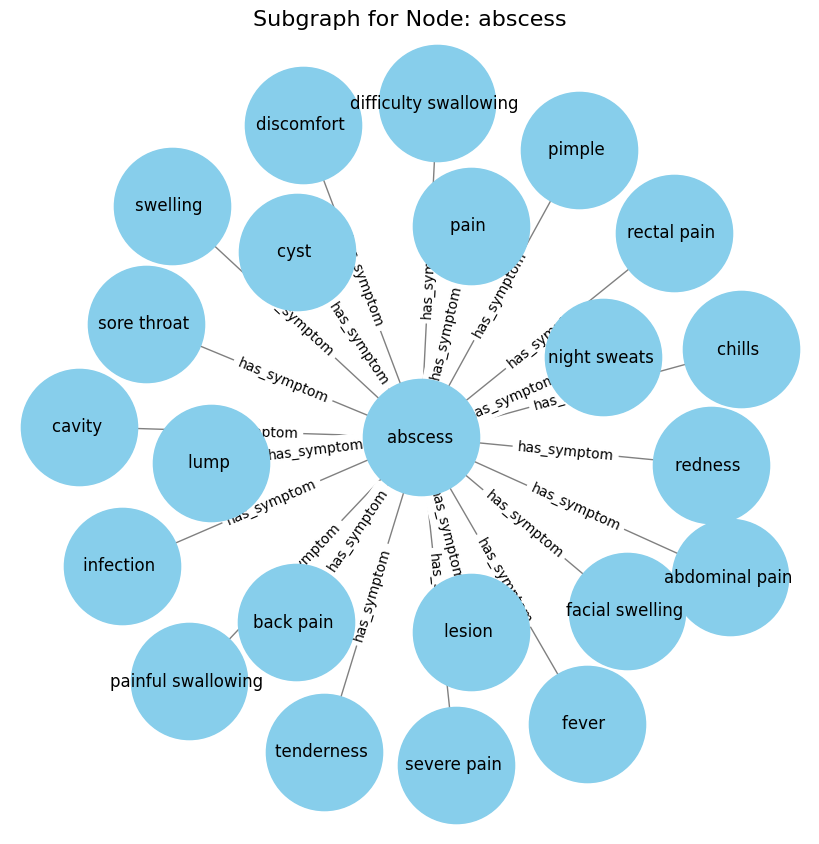

In [ ]:
target_node = "abscess"

# Extract neighbors of the target node
neighbors = list(G.neighbors(target_node))

# Create a subgraph with the target node, its neighbors, and edges
subgraph = G.subgraph([target_node] + neighbors)

# Visualize the subgraph with edge labels
plt.figure(figsize=(8, 8))
pos = nx.spring_layout(subgraph, seed=42)  # You can choose a different layout algorithm

# Draw nodes and labels
nx.draw(subgraph, pos, with_labels=True, node_size=7000, font_size=12, node_color="skyblue", font_color="black", edge_color="gray")

# Draw edge labels
edge_labels = nx.get_edge_attributes(subgraph, 'relationship')
nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels)

plt.title(f"Subgraph for Node: {target_node}", fontsize=16)
plt.show()

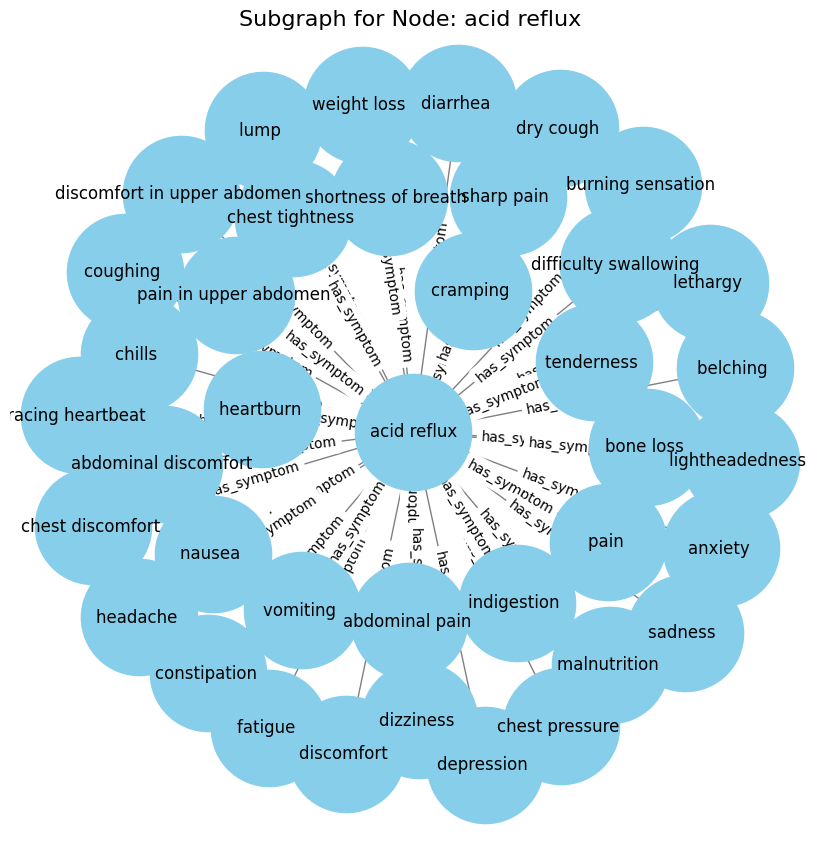

In [ ]:
target_node = "acid reflux"

# Extract neighbors of the target node
neighbors = list(G.neighbors(target_node))

# Create a subgraph with the target node, its neighbors, and edges
subgraph = G.subgraph([target_node] + neighbors)

# Visualize the subgraph with edge labels
plt.figure(figsize=(8, 8))
pos = nx.spring_layout(subgraph, seed=42)  # You can choose a different layout algorithm

# Draw nodes and labels
nx.draw(subgraph, pos, with_labels=True, node_size=7000, font_size=12, node_color="skyblue", font_color="black", edge_color="gray")

# Draw edge labels
edge_labels = nx.get_edge_attributes(subgraph, 'relationship')
nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels)

plt.title(f"Subgraph for Node: {target_node}", fontsize=16)
plt.show()

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Assuming you already have your graph G created with nodes and edges

# Create a figure and axis
plt.figure(figsize=(100, 100))
ax = plt.gca()

# Draw nodes with labels
pos = nx.spring_layout(G, seed=42)  # You can choose a layout algorithm of your choice

# Draw nodes
node_labels = {node: node for node in G.nodes()}
nx.draw_networkx_nodes(G, pos, node_size=1050, node_color="skyblue", ax=ax)

# Draw edges with labels
edge_labels = nx.get_edge_attributes(G, "relationship")
nx.draw_networkx_edges(G, pos, ax=ax)
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)

# Draw node labels
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=10, font_color="black")

# Show the graph
plt.axis("off")  # Turn off the axis
plt.title("Graph Visualization")
plt.show()


In [ ]:
!pip install py2neo

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.0/177.0 kB 3.4 MB/s eta 0:00:00


In [ ]:
from py2neo import Graph
from py2neo import Node, Relationship

In [ ]:
existing_nodes = set()

In [ ]:
graph.run("CREATE CONSTRAINT FOR (n:Disease) REQUIRE n.name IS UNIQUE")
graph.run("CREATE CONSTRAINT FOR (n:Symptom) REQUIRE n.name IS UNIQUE")

# Iterate through the rows of your result DataFrame
for _, row in resul_dataframe.iterrows():
    disease = row["Diseases"]
    symptom = row["Symptoms"]

    # Create or retrieve disease node
    disease_node = graph.nodes.match("Disease", name=disease).first()
    if not disease_node:
        disease_node = Node("Disease", name=disease)
        graph.create(disease_node)

    # Create or retrieve symptom node
    symptom_node = graph.nodes.match("Symptom", name=symptom).first()
    if not symptom_node:
        symptom_node = Node("Symptom", name=symptom)
        graph.create(symptom_node)

    # Create the relationship if it doesn't exist
    existing_relationship = graph.match((symptom_node, disease_node), r_type="IS_SYMPTOM_OF").first()
    if not existing_relationship:
        relationship = Relationship(symptom_node, "IS_SYMPTOM_OF", disease_node)
        graph.create(relationship)